In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from os import listdir, path
import random
from functools import partial
import resource
from math import pi

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from astropy.table import Table
import healpy as hp
from sklearn.metrics import mean_squared_error
from tqdm import tqdm, tqdm_notebook

from data import CMB_LENS_COLS, read_cmb_lensed_img, read_cmb_lensed_folder, read_train_data, \
    get_flat_mass_dist, get_flat_mass_dist_for_df
from plotting import plot_map, plot_cmb_imgs, plot_external_cmb_imgs
from evaluation import train_test_many_split
from utils import DATA_DIR_RELATIVE, DATA_DIR_CIS, DATA_DIR_MOUNT
from utils_healpy import get_cut_imgs

In [3]:
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 80

sns.set(style='ticks')
sns.set_palette('cubehelix')

In [4]:
data_dir = DATA_DIR_RELATIVE

# Getting train halos

In [5]:
halo_file = path.join(data_dir, 'skyhalo_nres13r000_M200b-min-1e14.fits')
halo_data = Table.read(halo_file, format='fits').to_pandas()

In [6]:
train_data = halo_data

In [25]:
train_data.shape

(495341, 19)

In [45]:
duplicates = train_data.loc[train_data.duplicated(subset=['ID', 'M200b'], keep='first')]

In [46]:
duplicates['ID'].shape

(143200,)

In [41]:
train_data.loc[train_data['ID'] == 659990]

,rockstar_file,ID,parent_ID,Mvir,M200b,M200c,M500c,M2500c,Rvir,Rs,z_halo,r_halo,Vr,theta_i,phi_i,theta_s,phi_s,ipix,kplane+1
343,b'hc_450Mpc_r000_001.list ',659990,-1,1.335000e+14,1.535000e+14,1.044800e+14,6.896300e+13,2.942600e+13,1086.051,225.94299,0.088196,255.62935,363.021240,1.475273,0.356938,1.475331,0.356934,364234565,2
344,b'hc_450Mpc_r000_001.list ',659990,-1,1.335000e+14,1.535000e+14,1.044800e+14,6.896300e+13,2.942600e+13,1086.051,225.94299,0.078332,230.78563,12.232373,1.464967,2.743812,1.465018,2.743762,360118245,2


In [5]:
for m in ['M200b', 'M200c', 'M500c', 'M2500c']:
    halo_data[m] = halo_data[m] / 1e14
    
halo_data = halo_data.loc[(halo_data['z_halo'] > 0.1) & (halo_data['z_halo'] < 0.3)]

halo_data.shape

(45520, 19)

In [6]:
# Only equator halos
equator_max_distance = pi / 9  # Almost 1/3 in latitude
lower_bound = pi / 2 - equator_max_distance
upper_bound = pi / 2 + equator_max_distance
halo_data = halo_data.loc[(lower_bound < halo_data['theta_i']) & (halo_data['theta_i'] < upper_bound)]
halo_data.shape

(15614, 19)

In [7]:
# Getting flat mass ditribution
halo_data_flat = get_flat_mass_dist_for_df(halo_data, col='M500c', n_bins=100, max_bin_size=100)
halo_data_flat.shape

(2496, 19)

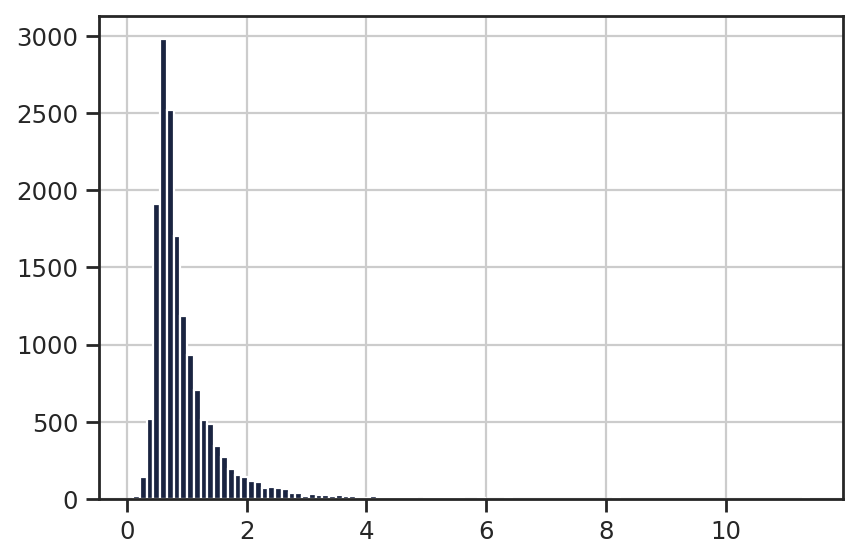

In [8]:
halo_data['M500c'].hist(bins=100)

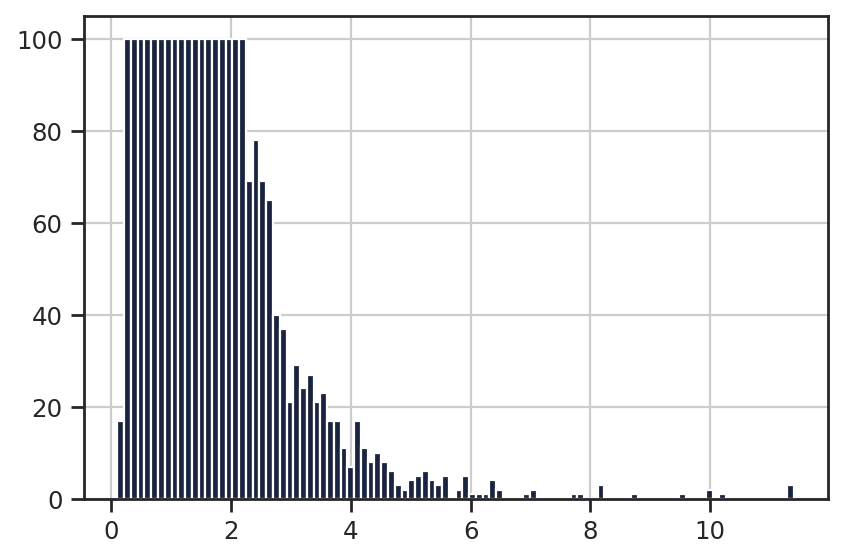

In [9]:
halo_data_flat['M500c'].hist(bins=100)

In [10]:
halo_data_flat.to_csv(path.join(data_dir, 'train_base', 'halo_nres13_r000_M200b-min-1e14_equator-pi-9_flat-mass-100-100.csv'), index=False)

# Extract CMB images based on train halo list

In [5]:
# Read train halos
train_data = pd.read_csv(path.join(data_dir, 'train_base', 'halo_nres13_r000_M200b-min-1e14_equator-pi-9_flat-mass-100-100.csv'))

In [7]:
# Read CMB
nres = 13
cmb_file = path.join(data_dir, 'lensed_cmbmap_betazero_nres{}r000.fits'.format(nres))
cmb_map = hp.read_map(cmb_file)

NSIDE = 8192
ORDERING = RING in fits file
INDXSCHM = IMPLICIT


<IPython.core.display.Javascript object>


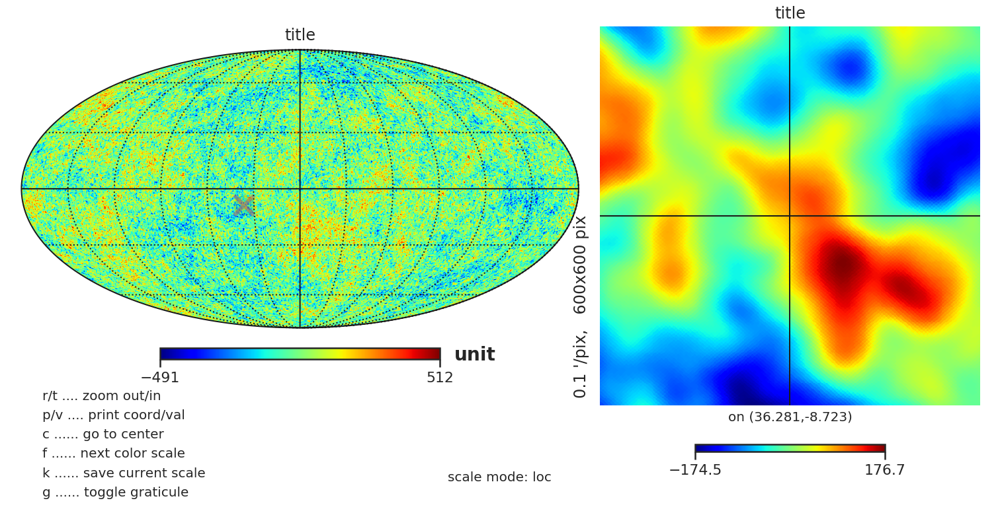

/mnt/home/snakoneczny/tools/anaconda3/envs/python3/lib/python3.6/site-packages/healpy/projaxes.py:1196: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if matplotlib.cbook.iterable(value):
/mnt/home/snakoneczny/tools/anaconda3/envs/python3/lib/python3.6/site-packages/healpy/projaxes.py:1155: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if matplotlib.cbook.iterable(value):


0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
82.976115752711 97.023884247289 -7.023884247289008 7.023884247289008
The interval between parallels is 1 deg 0.00'.
The interval between meridians is 1 deg 0.00'.


In [7]:
%matplotlib notebook
plot_map(cmb_map)

In [22]:
# Read projection
# nres = 13
# cmb_map_projected = np.load(path.join(data_dir, 'lensed_cmbmap_betazero_nres{}r000_cart-28378.npy'.format(nres)))
# cmb_map_projected.shape

(28378, 28378)

In [55]:
# Make projection
nres = 13
nside = 2 ** nres
# cmb_res = hp.pixelfunc.nside2resol(nside, arcmin=True)
# n_pix_x = int(360 * 60 / cmb_res)  # factor of 3.2 moves cut size from 40 to 128
n_pix_x = 800

projector = hp.projector.CartesianProj(xsize=n_pix_x)
cmb_map_projected = projector.projmap(cmb_map, partial(hp.pixelfunc.vec2pix, nside))

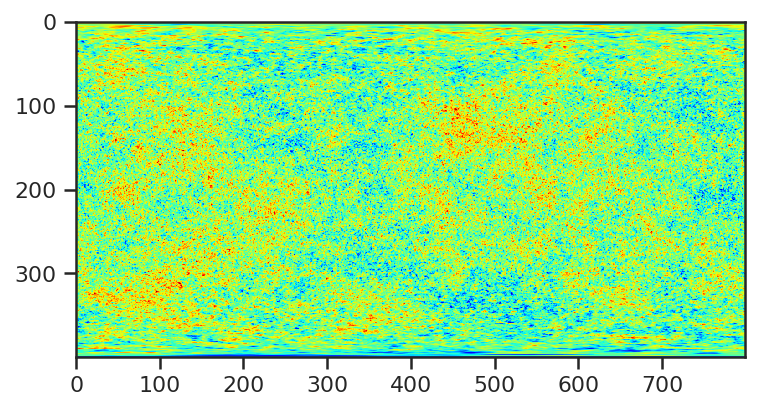

In [65]:
# Show projection
%matplotlib inline
plt.figure()
plt.imshow(cmb_map_projected, cmap='jet')
plt.show()

In [ ]:
# Save projection
projection_path = path.join(data_dir, 'lensed_cmbmap_betazero_nres{}r000_cartesian'.format(nres))
np.save(projection_path, cmb_map_projected)

In [8]:
# Read Masato's images
data_ext = read_cmb_lensed_folder('/mnt/home/snakoneczny/data/lensing_takahashi_17/cut_nres13_r000_fits', n_img=600)

In [9]:
train_data[['M200b', 'M500c']] /= 1e14

In [10]:
# Get datasets intersection on ID, theta_i and phi_i
data_common = train_data.merge(data_ext, how='inner', on=['ID', 'theta_i', 'phi_i'], suffixes=('_my', '_ext'))

In [39]:
data_common['image_my'] = get_cut_imgs(data_common, cmb_map, nres=nres).tolist()

In [40]:
data_common_sorted = data_common.sort_values(by='M500c_my', ascending=False)

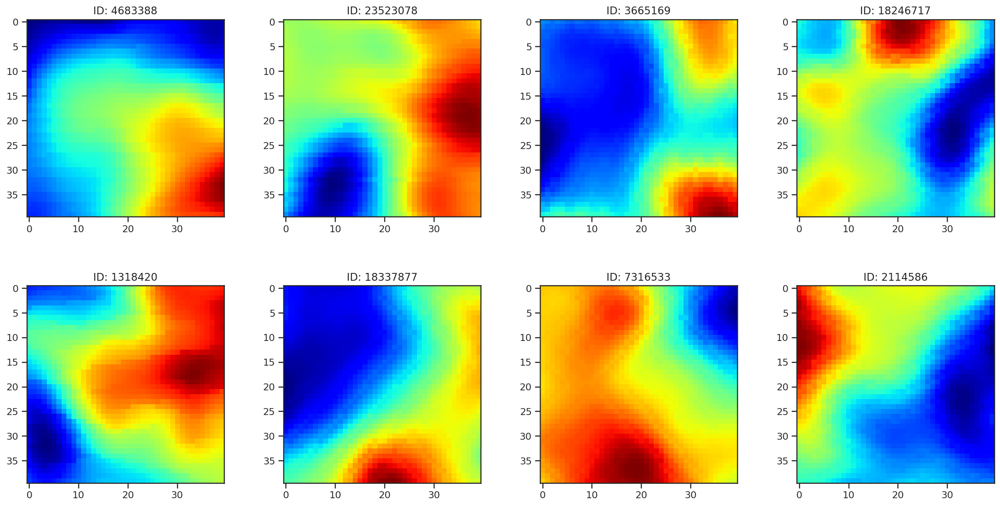

In [41]:
%matplotlib inline
plot_cmb_imgs(data_common_sorted, img_col='image_my', n_img=data_common_sorted.shape[0])

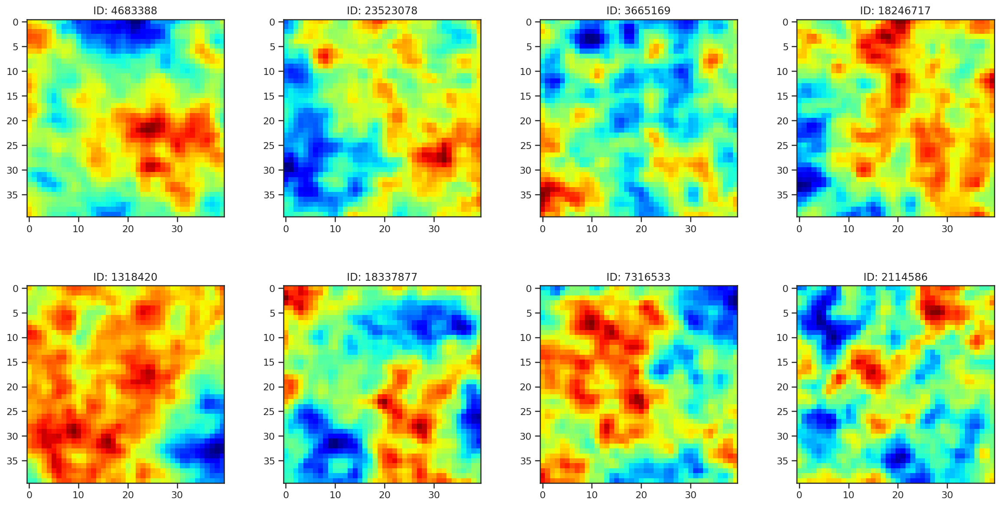

In [29]:
%matplotlib inline
plot_cmb_imgs(data_common_sorted, img_col='image_my', n_img=data_common_sorted.shape[0])

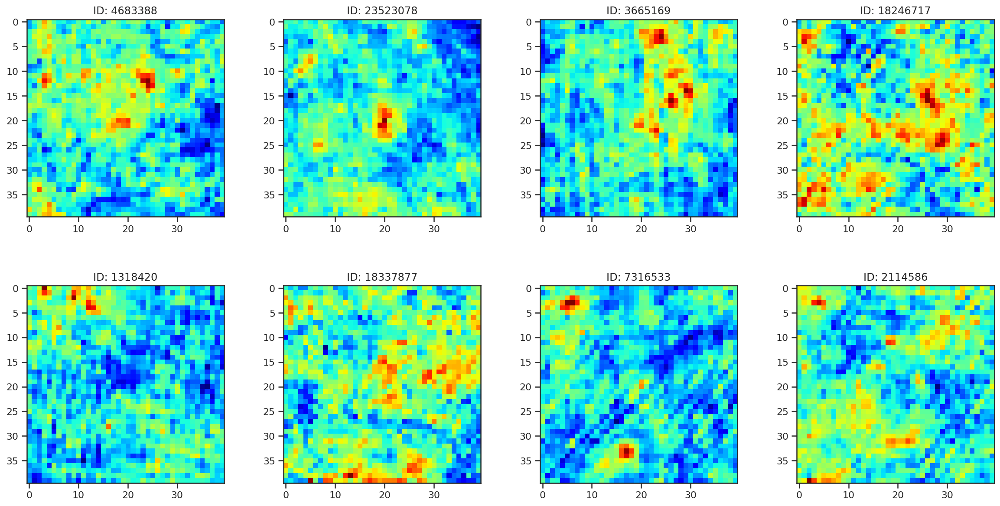

In [28]:
%matplotlib inline
plot_cmb_imgs(data_common_sorted, img_col='image', n_img=data_common_sorted.shape[0])

In [13]:
# Get our own custom cuts
train_data['image'] = get_cut_imgs_new(train_data, cmb_map, nres=nres).tolist()  # cut_size=40

KeyboardInterrupt: 

In [ ]:
train_data_sorted = train_data.sort_values(by='M500c', ascending=False)

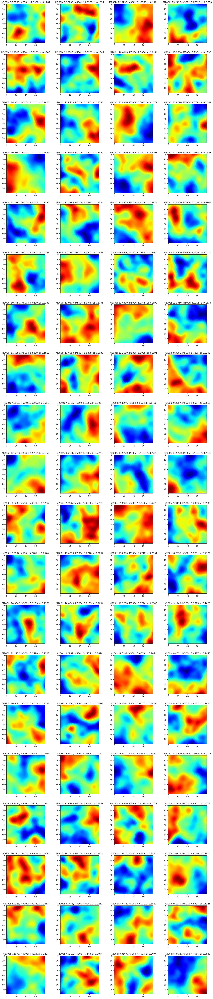

In [11]:
%matplotlib inline
plot_cmb_imgs(train_data_sorted)

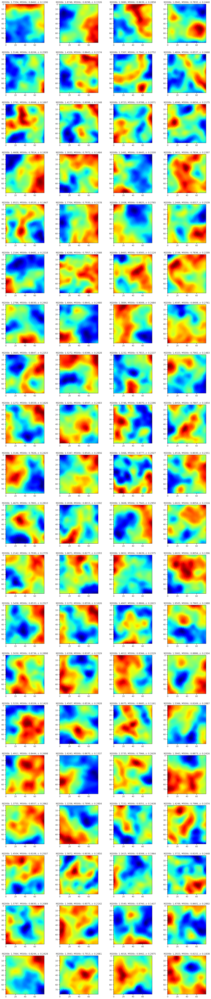

In [9]:
# New projection with roatation
%matplotlib inline
plot_cmb_imgs(images, train_data)

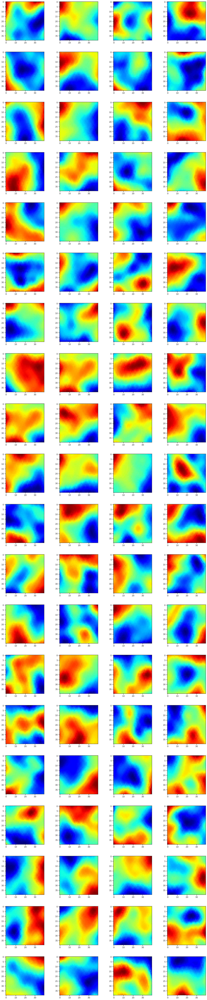

In [30]:
# New projection with roatation
%matplotlib inline
plot_cmb_imgs(images)

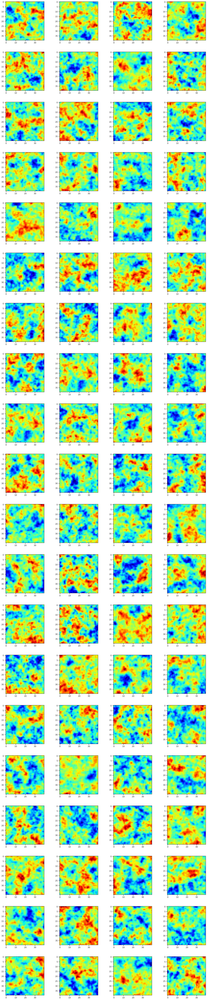

In [17]:
# Old projection with x_size 4000
%matplotlib inline
plot_cmb_imgs(images)

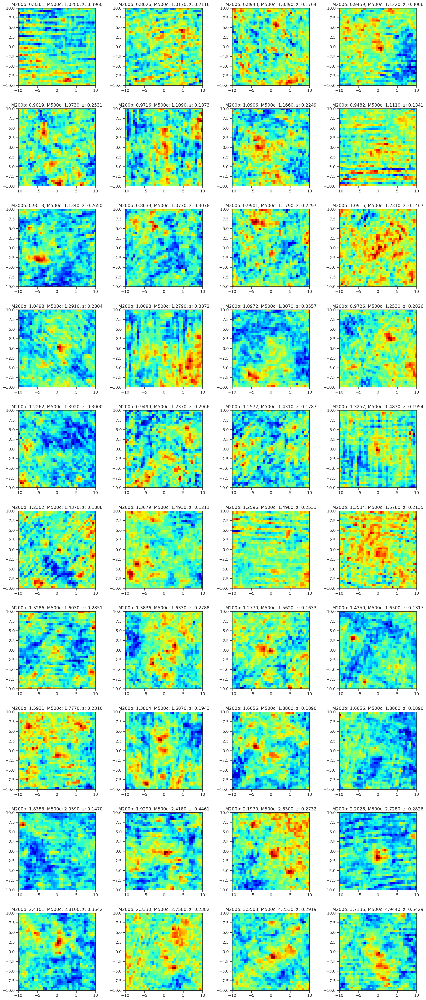

In [33]:
# Plot given subset of Masato's images
plot_external_cmb_imgs(data_ext)

In [12]:
# Save our projections
img_path = path.join(data_dir, 'train_base', 'imgs_nres13_r000_M200b-min-1e14_equator-pi-9_flat-mass-100-100')
np.save(img_path, images)

# CMB map visualization

In [9]:
halo_file = path.join(data_dir, 'skyhalo_nres12r000_1M.halo.fits')
halo_data = Table.read(halo_file, format='fits').to_pandas()

In [19]:
halo_data.describe()

,ID,parent_ID,Mvir,M200b,M200c,M500c,M2500c,Rvir,Rs,z_halo,r_halo,Vr,theta_i,phi_i,theta_s,phi_s,ipix,kplane+1
count,9.969430e+05,9.969430e+05,9.969430e+05,9.969430e+05,9.969430e+05,9.969430e+05,9.969430e+05,996943.000000,996943.000000,996943.000000,996943.000000,996943.000000,996943.000000,996943.000000,996943.000000,996943.000000,9.969430e+05,996943.000000
mean,1.282383e+07,2.810160e+04,6.477373e+12,6.683837e+12,5.784889e+12,3.801632e+12,1.116592e+12,328.773306,69.363383,0.450047,1144.467425,-3.894022,1.569506,3.145586,1.569541,3.145780,1.005591e+08,8.093709
std,7.684926e+06,4.631910e+05,1.505171e+13,1.553685e+13,1.350744e+13,9.059116e+12,3.163390e+12,211.554967,81.656084,0.334956,726.079307,330.698624,0.682810,1.812224,0.682792,1.812145,5.807553e+07,4.854443
min,1.800000e+01,-1.000000e+00,7.393000e+09,4.189500e+10,0.000000e+00,0.000000e+00,0.000000e+00,41.394001,0.069000,0.003084,7.878484,-3413.808300,0.001794,0.000000,0.001773,0.000003,1.750000e+02,1.000000
25%,6.239412e+06,-1.000000e+00,3.984000e+11,4.312700e+11,3.417300e+11,2.365800e+11,3.368000e+10,164.009000,18.646000,0.181738,523.798095,-211.784600,1.044941,1.577260,1.045044,1.577551,5.014152e+07,4.000000
50%,1.264300e+07,-1.000000e+00,1.820000e+12,1.951800e+12,1.574800e+12,1.064600e+12,2.218000e+11,280.397000,43.323002,0.359696,992.539000,-3.186679,1.569983,3.146386,1.570093,3.146765,1.005871e+08,7.000000
75%,1.889426e+07,-1.000000e+00,6.677000e+12,6.982500e+12,5.888300e+12,3.859300e+12,9.537300e+11,449.353000,90.058998,0.628846,1620.625200,204.922005,2.091766,4.711622,2.091773,4.711628,1.507673e+08,11.000000
max,3.010283e+07,2.095340e+07,1.365000e+15,1.459900e+15,1.144300e+15,8.076600e+14,4.277200e+14,2475.412100,1694.892000,3.614642,4927.302200,2735.949700,3.139799,6.282994,3.139595,6.283184,2.013264e+08,33.000000


In [10]:
nres = 13
NSIDE = 2 ** nres

cmb_file = path.join(data_dir, 'lensed_cmbmap_betazero_nres{}r000.fits'.format(nres))
cmb_map = hp.read_map(cmb_file)

NSIDE = 8192
ORDERING = RING in fits file
INDXSCHM = IMPLICIT


<IPython.core.display.Javascript object>


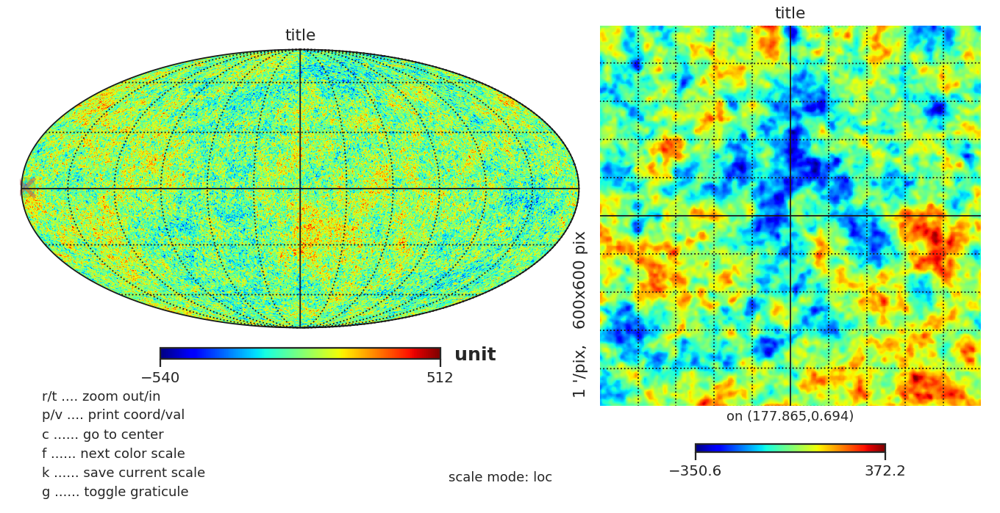

/mnt/home/snakoneczny/tools/anaconda3/envs/python3/lib/python3.6/site-packages/healpy/projaxes.py:1196: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if matplotlib.cbook.iterable(value):
/mnt/home/snakoneczny/tools/anaconda3/envs/python3/lib/python3.6/site-packages/healpy/projaxes.py:1155: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if matplotlib.cbook.iterable(value):
/mnt/home/snakoneczny/tools/anaconda3/envs/python3/lib/python3.6/site-packages/healpy/projaxes.py:1155: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if matplotlib.cbook.iterable(value):
/mnt/home/snakoneczny/tools/anaconda3/envs/python3/lib/python3.6/site-packages/healpy/projaxes.py:1196: MatplotlibDeprecationWarning: 
The iterable functi

0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
82.976115752711 97.023884247289 -7.023884247289008 7.023884247289008
The interval between parallels is 1 deg 0.00'.
The interval between meridians is 1 deg 0.00'.


/mnt/home/snakoneczny/tools/anaconda3/envs/python3/lib/python3.6/site-packages/healpy/projaxes.py:1196: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if matplotlib.cbook.iterable(value):
/mnt/home/snakoneczny/tools/anaconda3/envs/python3/lib/python3.6/site-packages/healpy/projaxes.py:1155: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if matplotlib.cbook.iterable(value):
/mnt/home/snakoneczny/tools/anaconda3/envs/python3/lib/python3.6/site-packages/healpy/projaxes.py:1155: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if matplotlib.cbook.iterable(value):


In [13]:
%matplotlib notebook
plot_map(cmb_map)

<IPython.core.display.Javascript object>


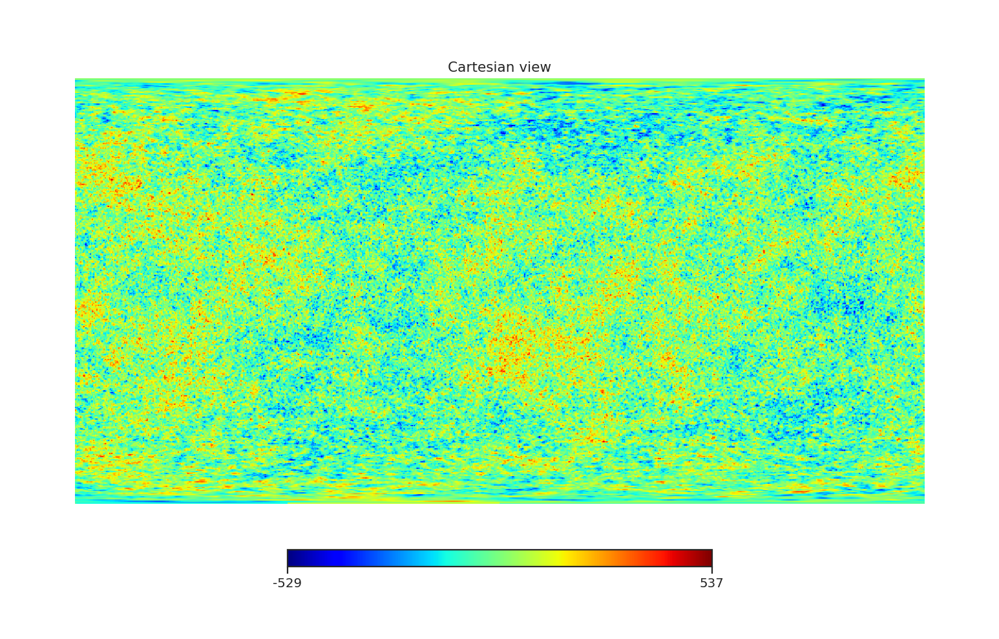

/mnt/home/snakoneczny/tools/anaconda3/envs/python3/lib/python3.6/site-packages/healpy/projaxes.py:1196: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if matplotlib.cbook.iterable(value):
/mnt/home/snakoneczny/tools/anaconda3/envs/python3/lib/python3.6/site-packages/healpy/projaxes.py:1155: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if matplotlib.cbook.iterable(value):
/mnt/home/snakoneczny/tools/anaconda3/envs/python3/lib/python3.6/site-packages/healpy/projaxes.py:1155: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if matplotlib.cbook.iterable(value):


In [12]:
%matplotlib notebook
hp.visufunc.cartview(map=cmb_map)

# Get file base of all external CMB images

In [46]:
folder = '/users/snakoneczny/data/lensing_takahashi_17/cmb_lens_imgs'

output_file = '/users/snakoneczny/workspace/cmb_lensing/file_base/file_base.csv'
file_base = pd.DataFrame(columns=all_cols)

all_cols = ['file_name'] + CMB_LENS_COLS

In [55]:
# MacOS requirements for number of open files
n_img = 20000
resource.setrlimit(resource.RLIMIT_NOFILE, (n_img + 10, -1))

file_list = listdir(folder)
n_img_read = 0
for i, file_name in enumerate(tqdm_notebook(file_list, desc='Reading data')):

    if not file_base['file_name'].str.contains(file_name).any():
        n_img_read += 1

        file_path = join(folder, file_name)
        img, img_info = read_cmb_lensed_img(file_path)

        img_info['file_name'] = file_name

        file_base = file_base.append(img_info, ignore_index=True)
    
    if n_img_read >= n_img:
        print('Rerun the cell!')
        break

In [61]:
print(file_base.shape)  # 45670

(45670, 9)


In [60]:
# TODO: check if "unnamed: 0" column is present
file_base.to_csv(output_file, index=False)

# Flat mass distribution on file base

In [94]:
file_base = pd.read_csv('/users/snakoneczny/workspace/cmb_lensing/file_base/file_base.csv')

In [95]:
files_flat, y_flat = get_flat_mass_distribution(file_base_2['file_name'], file_base_2['M500c'], n_bins=100, max_bin_size=100)
print(files_flat.shape)

(2923,)


In [106]:
file_path = '/users/snakoneczny/workspace/cmb_lensing/file_base/mflat_nbins=100_binsize=100'
np.savetxt(file_path, files_flat.values, fmt='%s')

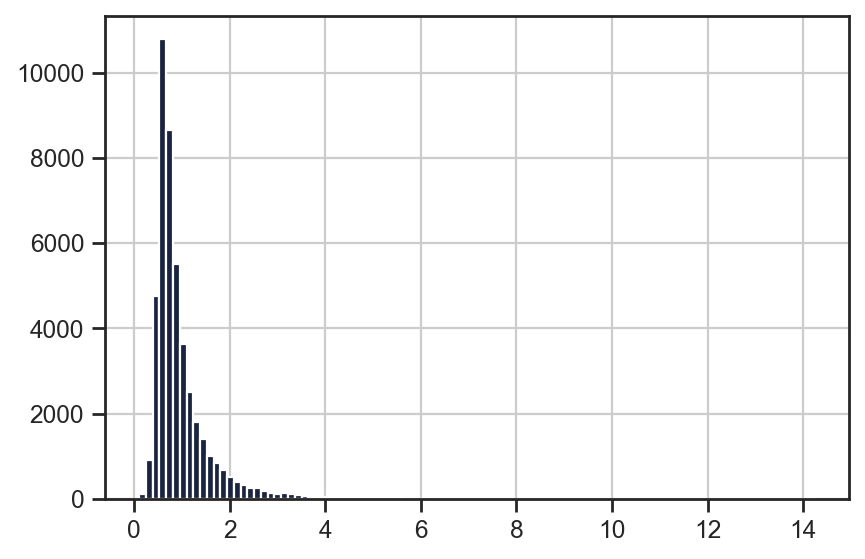

In [96]:
file_base['M500c'].hist(bins=100)

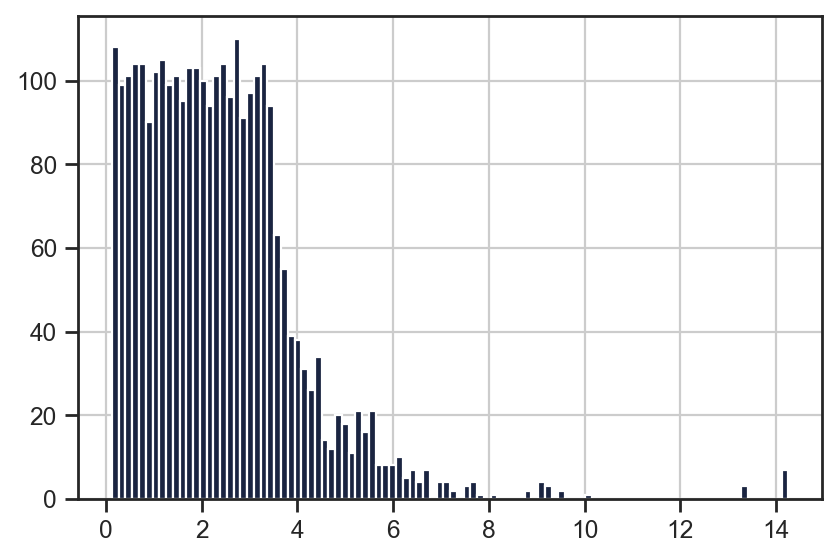

In [97]:
y_flat.hist(bins=100)

# Flat mass distribution

In [5]:
X, y = read_train_data('/users/snakoneczny/data/lensing_takahashi_17/cmb_lens_imgs', n_img=20000, col_y='M500c')
X = X.reshape(X.shape[0], X.shape[1], X.shape[2], 1)
print(X.shape)

Reading data: 100%|██████████| 20000/20000 [01:39<00:00, 200.48it/s]


(20000, 40, 40, 1)


In [6]:
X_flat, y_flat = get_flat_mass_distribution(X, y, n_bins=100, max_bin_size=100)
print(X_flat.shape)

(2371, 40, 40, 1)


In [13]:
X_flat_log, y_flat_log = get_flat_mass_distribution(X, np.log(y), n_bins=100, max_bin_size=100)
print(X_flat.shape)

(2371, 40, 40, 1)


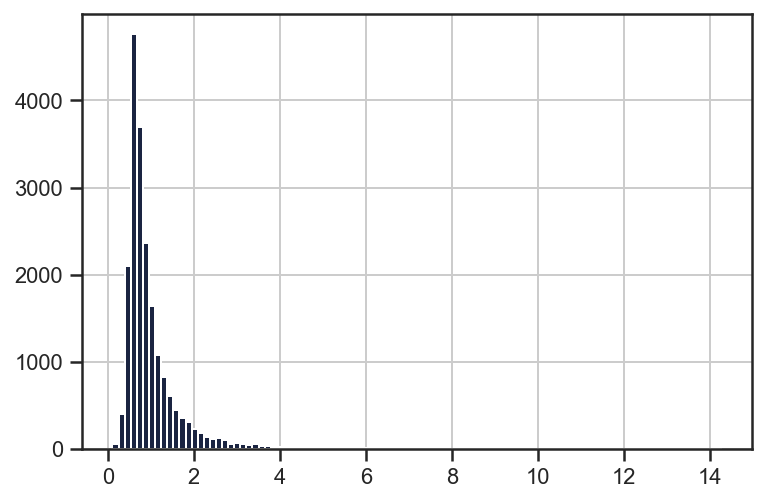

In [14]:
pd.Series(y).hist(bins=100)

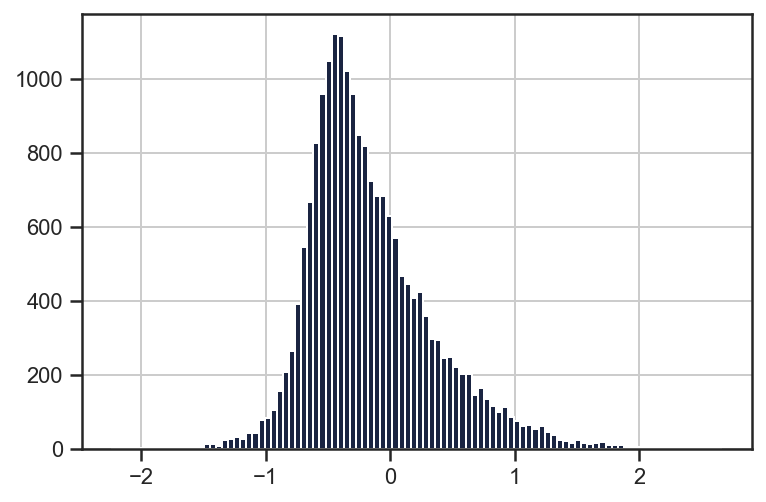

In [15]:
pd.Series(np.log(y)).hist(bins=100)

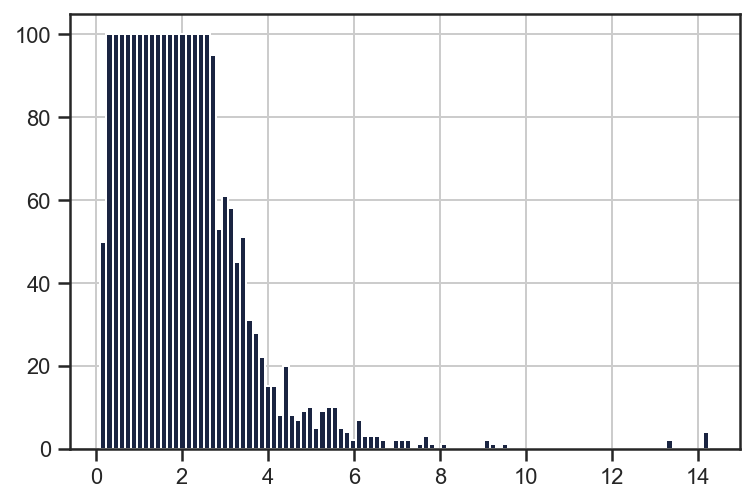

In [16]:
pd.Series(y_flat).hist(bins=100)

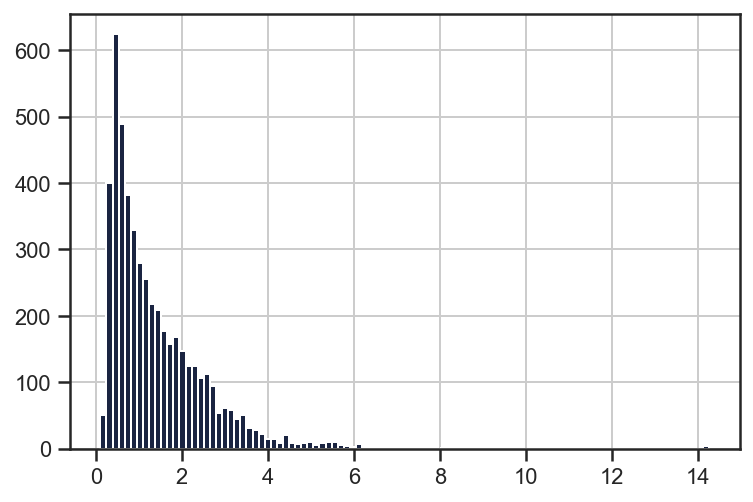

In [18]:
pd.Series(np.exp(y_flat_log)).hist(bins=100)

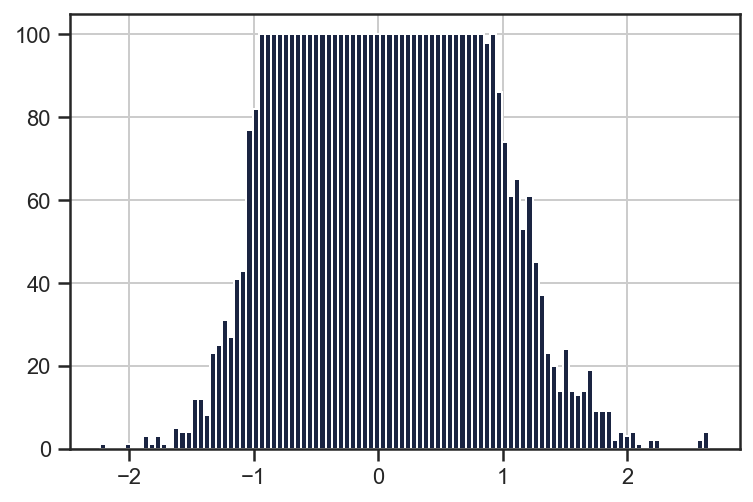

In [17]:
pd.Series(y_flat_log).hist(bins=100)

# Redshift and mass

In [4]:
data = read_cmb_lensed_folder('/users/snakoneczny/data/lensing_takahashi_17/cmb_lens_imgs', n_img=20000)

Reading data: 100%|██████████| 20000/20000 [02:33<00:00, 130.44it/s]


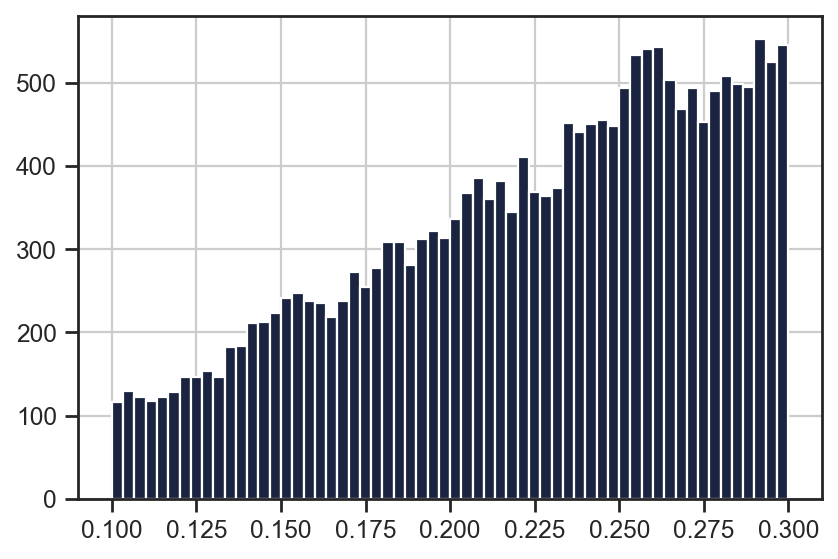

In [7]:
data['Redshift'].hist(bins=60)
# plt.xlim(xmax=8)

In [5]:
data.loc[data['Redshift'] < 0.2].describe()

,M200b,M200c,M500c,Mvir,Ngrid,R_scale,Redshift,pix_size
count,6414.000000,6414.000000,6414.000000,6414.000000,6414.0,6414.000000,6414.000000,6414.0
mean,1.993334,1.488964,0.998665,1.805464,40.0,0.272688,0.158855,0.5
std,1.482797,1.154954,0.795796,1.361822,0.0,0.153503,0.027467,0.0
min,1.000200,0.380440,0.107380,0.613100,40.0,0.069532,0.100002,0.5
25%,1.201225,0.899300,0.604140,1.087000,40.0,0.178868,0.138360,0.5
50%,1.529000,1.136550,0.773170,1.381500,40.0,0.233097,0.161919,0.5
75%,2.209575,1.651500,1.108725,2.006000,40.0,0.314498,0.182565,0.5
max,27.864000,20.162000,14.256000,24.890000,40.0,1.536595,0.199991,0.5


In [6]:
data.loc[data['Redshift'] > 0.2].describe()

,M200b,M200c,M500c,Mvir,Ngrid,R_scale,Redshift,pix_size
count,13586.000000,13586.000000,13586.000000,13586.000000,13586.0,13586.000000,13586.000000,13586.0
mean,1.894110,1.465947,0.979353,1.744161,40.0,0.290873,0.253741,0.5
std,1.246529,0.989554,0.675642,1.157923,0.0,0.158281,0.028294,0.0
min,1.000000,0.380050,0.174150,0.649600,40.0,0.083795,0.200001,0.5
25%,1.176000,0.910450,0.609270,1.082000,40.0,0.192942,0.230760,0.5
50%,1.469050,1.134500,0.765775,1.350000,40.0,0.250432,0.255634,0.5
75%,2.078750,1.615725,1.089300,1.915000,40.0,0.337154,0.278170,0.5
max,16.949000,14.312000,9.512800,16.070000,40.0,1.721934,0.299997,0.5


(-0.34320000000000017, 8)

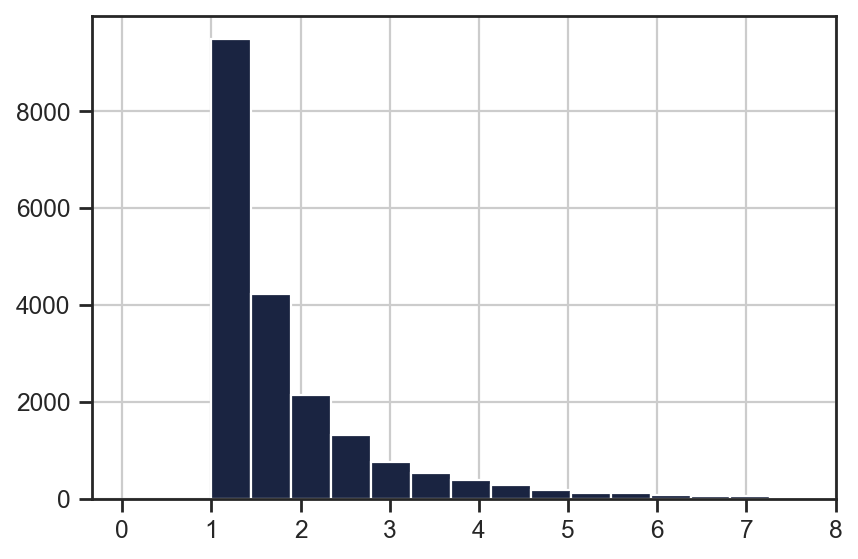

In [5]:
data['M200b'].hist(bins=60)
plt.xlim(xmax=8)

(-0.6000510000000001, 6)

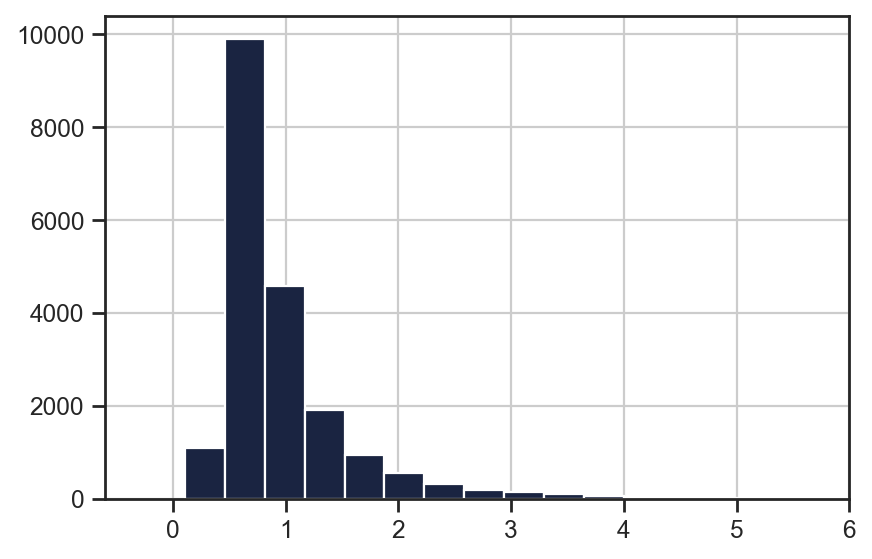

In [6]:
data['M500c'].hist(bins=40)
plt.xlim(xmax=6)

# Errors from mean values

In [7]:
# MSE when predicting mean values
masses = ['M200b', 'M500c']
for mass in masses:
    mean = data[mass].mean()
    mse = mean_squared_error(data[mass], [mean] * data.shape[0])
    print('MSE when estimating mean {} value: {:.4f}'.format(mass, mse))

MSE when estimating mean M200b value: 1.7626
MSE when estimating mean M500c value: 0.5132


In [8]:
# Mean values MSE with mass relevant train-test split
_, y_test_low, y_test_high, y_test_random =\
    train_test_many_split(data['M500c'], side_test_size=0.05, random_test_size=0.1)
to_pred = [
    ('random', y_test_random),
    ('low', y_test_low),
    ('high', y_test_high),
]
for mass in masses:
    for test_name, y_test in to_pred:
        mean = y_test.mean()
        mse = mean_squared_error(y_test, [mean] * len(y_test))
        print('MSE when estimating mean {} value on {} test: {:.4f}'.format(mass, test_name, mse))

MSE when estimating mean M200b value on random test: 0.1334
MSE when estimating mean M200b value on low test: 0.0041
MSE when estimating mean M200b value on high test: 1.8975
MSE when estimating mean M500c value on random test: 0.1334
MSE when estimating mean M500c value on low test: 0.0041
MSE when estimating mean M500c value on high test: 1.8975


/Users/snakoneczny/workspace/cmb_lensing/utils.py:94: FutureWarning: Series.flags is deprecated and will be removed in a future version
  indices = indices if indices.flags.writeable else indices.copy()


# External CMB lensed images

In [11]:
# nres 13, realization 054, original Masatao's images
data = read_cmb_lensed_folder('/mnt/home/snakoneczny/data/lensing_takahashi_17/cut_nres13_r054_fits_org', n_img=80)

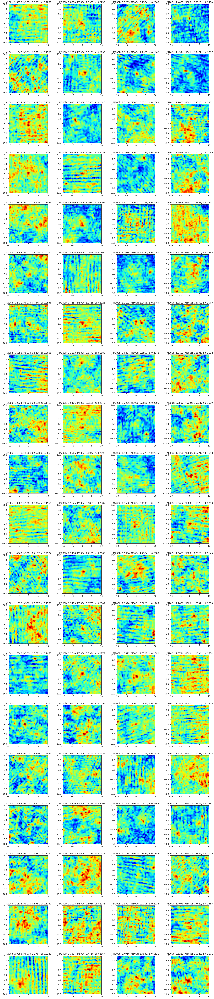

In [13]:
%matplotlib inline
plot_external_cmb_imgs(data)

In [13]:
# nres 13, realization 000
data = read_cmb_lensed_folder('/mnt/home/snakoneczny/data/lensing_takahashi_17/cut_nres13_r000_fits', n_img=350)

In [22]:
width = 0.17  # 10 degrees
top_pole = width
bottom_pole = 3.14 - width
top_equator = 3.14 / 2 - width
bottom_equator = 3.14 / 2 + width

data_poles = data.loc[(data['theta_i'] < top_pole) | (data['theta_i'] > bottom_pole)]
data_equator = data.loc[(data['theta_i'] > top_equator) & (data['theta_i'] < bottom_equator)]

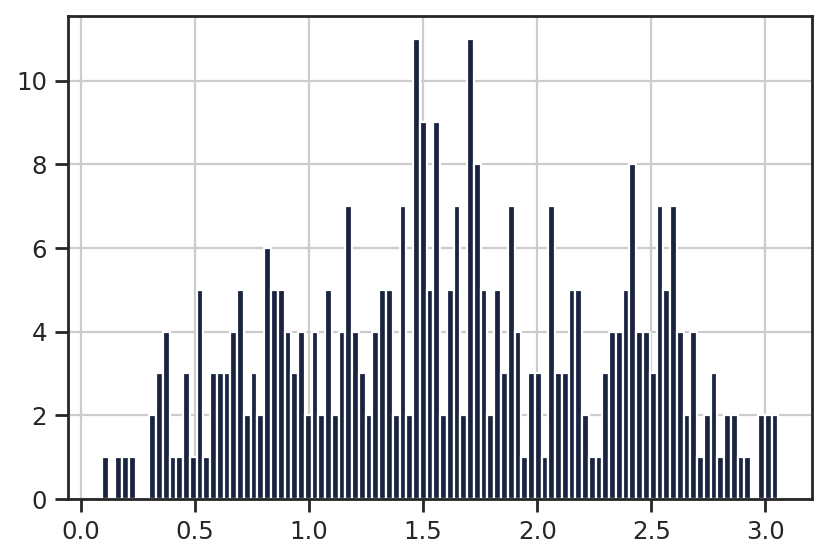

In [11]:
data['theta_i'].hist(bins=100)

In [23]:
print(data.shape)
print(data_poles.shape)
print(data_equator.shape)

(350, 11)
(8, 11)
(72, 11)


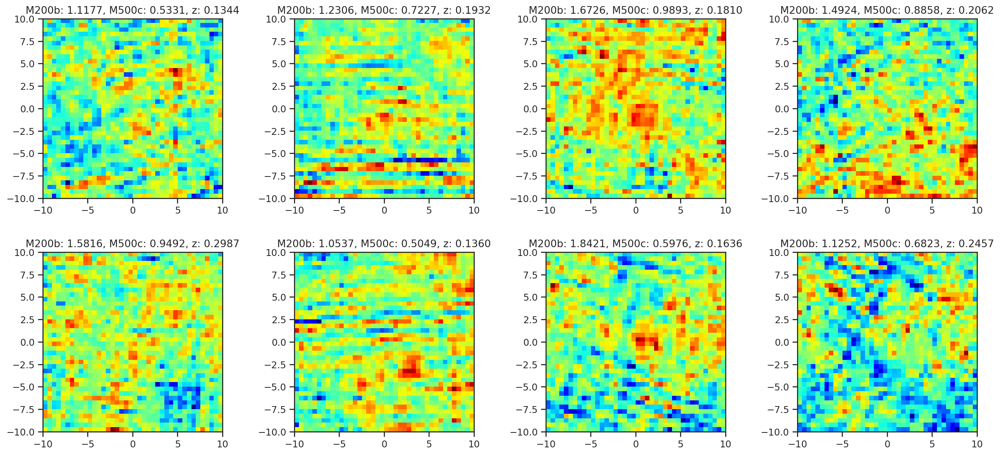

In [36]:
plot_cmb_imgs(data_poles)

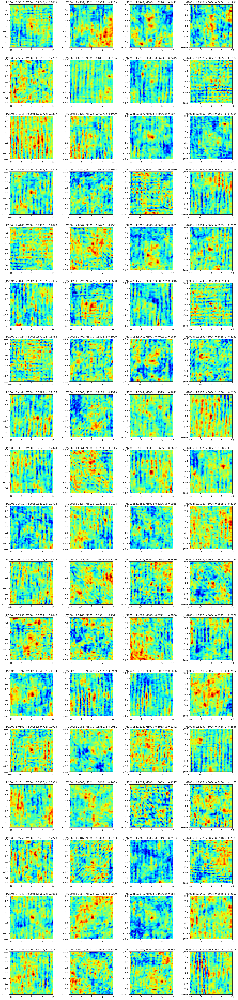

In [37]:
plot_cmb_imgs(data_equator)

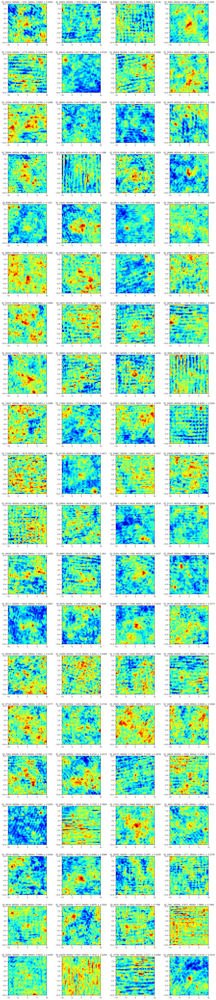

In [22]:
plot_cmb_imgs(file_list)